<a href="https://colab.research.google.com/github/CA683-Group99/Wind-Energy-Prediction/blob/main/4_IslandElectricityRandomForestModel_transformedTime.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

RESULTS PER OPTION:

- Latest:

      'hour', 'wdsp_BEL', 'wddir_BEL', 'wdsp', 'wddir', 'msl',
      'wdsp_COR', 'wddir_COR', 'wdsp_DUB', 'wddir_DUB', 
      'temp_DUB', 'radianTimeSin', 'radianTimeCos', 'TotalWindCapacityMW'
Eirgrid Wind Forecast Week MAE: 465.4 - RMSE: 672.9 - r2_score: 0.611

 RF Week MAE: 166.3 - RF Week RMSE: 247.1 - RF Week Train r2_score: 0.948

- Original 4_IslandElectricityRandomForestModel:

      'hour', 'isweekday', 'month', 'wdsp_BEL', 'wddir_BEL', 'temp_BEL',
       'wdsp', 'wddir', 'wdsp_COR', 'wddir_COR', 'wdsp_DUB', 'wddir_DUB',
       'temp_DUB', 'TotalWindCapacityMW'],


MAE: 272.26593735961364
RMSE: 360.6494999475853
Train r2_score: 0.8544186552101587

- radianTime instead of Month and Hour X_train.columns:
      'isweekday', 'wdsp_BEL', 'wddir_BEL', 'temp_BEL', 'wdsp', 'wddir',
      'wdsp_COR', 'wddir_COR', 'wdsp_DUB', 'wddir_DUB', 'temp_DUB',
      'radianTime', 'Day_inYear', 'TotalWindCapacityMW'

MAE: 292.7106431098383
RMSE: 381.47832078345976
Test r2_score: 0.8371173664337087

- With Day_inYear and hour:
      ['hour', 'isweekday', 'wdsp_BEL', 'wddir_BEL', 'temp_BEL', 'wdsp',
       'wddir', 'wdsp_COR', 'wddir_COR', 'wdsp_DUB', 'wddir_DUB', 'temp_DUB',
       'Day_inYear', 'TotalWindCapacityMW']
MAE: 272.65383788185085
RMSE: 358.0680549323199
Test r2_score: 0.8564952711814031


- Wind transformed option: 
      'date', 'hour', 'isweekday', 'wdsp_BELx', 'wdsp_BELy', 'temp_BEL',
       'wdspx', 'wdspy', 'wdsp_CORx', 'wdsp_CORy', 'wdsp_DUBx', 'wdsp_DUBy',
       'temp_DUB', 'Day_inYear', 'TotalWindCapacityMW', 'ActualWindMW',
       'ForecastWndMW', 'ActualDemandMW',
       
RF Week MAE: 265.3
RF Week RMSE: 328.0
RF Week Train r2_score: 0.9202757692338636


In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load in 

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import math

import io
import requests


from plotly.offline import iplot
import plotly.graph_objs as go
from plotly import tools
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
import plotly.figure_factory as ff

import warnings
warnings.filterwarnings('ignore')


from datetime import tzinfo, timedelta, datetime, date

# Any results you write to the current directory are saved as output.

import plotly.express as px
import seaborn as sns

import os

import IPython
import IPython.display
import matplotlib as mpl
import matplotlib.pyplot as plt

import tensorflow as tf

mpl.rcParams['figure.figsize'] = (8, 6)
mpl.rcParams['axes.grid'] = False

# Load feature vector


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
import os
os.chdir('/content/drive/MyDrive/CA683Project')
!ls "Data/"

 CO2_2017_2020Hourly_v1.csv
 CO2_2017_2020v1.csv
 IrelandWeatherData.csv
 IslandElectricity2017_2020v3.csv
 IslandElectricity2017_2020v4.csv
'System-and-Renewable-Data-Summary-Report (5).csv'
'WindInstalledCapacities_MW_Monthly - Sheet1.csv'


In [4]:
fileP = 'Data/IslandElectricity2017_2020v4.csv'
newdf = pd.read_csv(fileP, parse_dates=[1], na_values=" ")

latestWindCapacityMW = newdf['TotalWindCapacityMW'].max()

In [5]:
latestWindCapacityMW

5576.095

In [6]:
# Cut off dates
cutOffValidationDate = "2021-02-28"
cutOffTestDate = "2021-03-15"
max_date = "2021-03-30"


In [7]:
#Krystian: Looking for maximal extreme values
print('-----------DATA SIZE -------------')
print(newdf.shape)           # 10 Columns, 35044 rows
count_row = newdf.shape[0]   # 10 Columns
count_col = newdf.shape[1]   # 35044 rows
print('Rows: ', count_row, ', Columns: ', count_col)

print('-----------DATA INFO -------------')
print(newdf.info())

print('-----------DATA MAX Values -------------')
newdf.max()

print('-----------DATA COLUMNS-------------')
columns = newdf.columns.values.tolist()
print (columns)

print('-----------BASIC STATISTICS-------------')
newdf.describe()

-----------DATA SIZE -------------
(33600, 77)
Rows:  33600 , Columns:  77
-----------DATA INFO -------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33600 entries, 0 to 33599
Data columns (total 77 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   Unnamed: 0           33600 non-null  int64         
 1   date                 33600 non-null  datetime64[ns]
 2   rain_BEL             33600 non-null  float64       
 3   temp_BEL             33600 non-null  float64       
 4   wetb_BEL             33600 non-null  float64       
 5   dewpt_BEL            33600 non-null  float64       
 6   vappr_BEL            33600 non-null  float64       
 7   rhum_BEL             33600 non-null  int64         
 8   msl_BEL              33600 non-null  float64       
 9   wdsp_BEL             33600 non-null  int64         
 10  wddir_BEL            33600 non-null  int64         
 11  rain_DUB             33600 non-null

,Unnamed: 0,rain_BEL,temp_BEL,wetb_BEL,dewpt_BEL,vappr_BEL,rhum_BEL,msl_BEL,wdsp_BEL,wddir_BEL,rain_DUB,temp_DUB,wetb_DUB,dewpt_DUB,vappr_DUB,rhum_DUB,msl_DUB,wdsp_DUB,wddir_DUB,ww_DUB,w_DUB,sun_DUB,vis_DUB,clht_DUB,clamt_DUB,rain,temp,wetb,dewpt,vappr,rhum,msl,wdsp,wddir,ww,w,sun,vis,clht,clamt,rain_COR,temp_COR,wetb_COR,dewpt_COR,vappr_COR,rhum_COR,msl_COR,wdsp_COR,wddir_COR,ww_COR,w_COR,sun_COR,vis_COR,clht_COR,clamt_COR,rain_MAL,temp_MAL,wetb_MAL,dewpt_MAL,vappr_MAL,rhum_MAL,msl_MAL,wdsp_MAL,wddir_MAL,Unnamed: 0.1,ActualDemandMW,ForecastWndMW,ActualWindMW,ActualGenerationMW,NetTotal_MW,WindMWPercent,hour,month,year,TotalWindCapacityMW
count,33600.000000,33600.000000,33600.000000,33600.000000,33600.000000,33600.000000,33600.000000,33600.000000,33600.000000,33600.000000,33600.000000,33600.000000,33600.000000,33600.000000,33600.000000,33600.000000,33600.000000,33600.000000,33600.000000,33600.000000,33600.000000,33600.000000,33600.000000,33600.000000,33600.000000,33600.000000,33600.000000,33600.000000,33600.000000,33600.000000,33600.000000,33600.000000,33600.000000,33600.000000,33600.000000,33600.000000,33600.000000,33600.000000,33600.000000,33600.000000,33600.000000,33600.000000,33600.000000,33600.000000,33600.000000,33600.000000,33600.000000,33600.000000,33600.000000,33600.000000,33600.000000,33600.000000,33600.000000,33600.000000,33600.000000,33600.000000,33600.000000,33600.000000,33600.000000,33600.000000,33600.000000,33600.000000,33600.000000,33600.000000,33600.000000,33600.000000,33600.000000,33600.000000,33600.000000,33600.000000,33600.000000,33600.00000,33600.000000,33600.000000,33600.000000
mean,16799.500000,0.162122,10.280071,8.877583,7.274952,10.584509,81.936905,1011.525539,12.211131,200.213988,0.087307,9.661589,8.170869,6.499024,10.104280,81.800327,1013.026140,9.765060,207.391071,14.953065,29.605179,0.165586,27845.437500,290.984911,5.614613,0.127244,10.492896,8.790295,7.340173,10.659866,81.998601,1013.200744,9.133095,192.249405,17.912351,35.369792,0.156071,22210.607143,284.064464,5.649970,0.149470,9.864208,8.560057,7.427327,10.745634,85.844226,1013.890732,9.894643,213.896726,17.163006,32.642351,0.170982,28123.906548,288.067024,5.575179,0.138756,9.908705,8.475807,6.796500,10.248937,81.089613,1011.010976,15.153274,200.709821,16799.500000,4221.499308,1414.970647,1370.394271,4253.165484,-0.418683,32.848624,11.50000,6.567857,2018.909286,5034.357287
std,9699.628859,0.509453,3.982742,3.780466,4.229559,2.995248,11.135898,13.474948,6.705256,92.759059,0.416319,5.093129,4.502528,4.562124,3.145635,12.110692,12.773605,4.803423,81.650126,22.868870,26.975035,0.321402,13536.778303,401.907763,2.261595,0.466629,4.866535,5.359242,4.374849,3.143949,12.199873,12.767280,5.268331,87.529392,23.608429,29.151471,0.316215,12517.237188,410.316123,2.431871,0.559227,4.604582,5.177824,4.492878,3.230851,12.155278,12.440711,5.173881,84.401786,23.435816,27.882069,0.333343,18024.219981,420.092208,2.400433,0.477016,3.906542,3.772044,4.239441,2.940448,9.817546,13.568919,7.283023,85.878053,9699.628859,844.213482,1101.054661,990.183503,753.112013,528.605591,23.184011,6.92229,3.514670,1.175809,452.831289
min,0.000000,0.000000,-3.300000,-4.400000,-9.700000,2.900000,24.000000,959.100000,0.000000,10.000000,0.000000,-5.600000,-49.900000,-8.900000,3.100000,24.000000,965.900000,0.000000,0.000000,1.000000,0.000000,0.000000,100.000000,1.000000,0.000000,0.000000,-4.800000,-49.000000,-8.300000,3.300000,24.000000,967.300000,0.000000,0.000000,1.000000,0.000000,0.000000,100.000000,1.000000,0.000000,0.000000,-6.900000,-49.000000,-9.200000,3.100000,26.000000,970.100000,0.000000,0.000000,1.000000,0.000000,0.000000,15.000000,1.000000,0.000000,0.000000,-2.000000,-3.000000,-7.900000,3.400000,20.000000,956.600000,1.000000,10.000000,0.000000,2394.750000,10.500000,-44.750000,1939.250000,-1415.000000,-0.943098,0.00000,1.000000,2017.000000,4096.494000
25%,8399.750000,0.000000,7.500000,6.100000,4.100000,8.200000,74.000000,1002.700000,7.000000,140.000000,0.000000,6.000000,4.90000

In [8]:
newdf[newdf.wdsp_DUB.isnull()== True]

,Unnamed: 0,date,rain_BEL,temp_BEL,wetb_BEL,dewpt_BEL,vappr_BEL,rhum_BEL,msl_BEL,wdsp_BEL,wddir_BEL,rain_DUB,temp_DUB,wetb_DUB,dewpt_DUB,vappr_DUB,rhum_DUB,msl_DUB,wdsp_DUB,wddir_DUB,ww_DUB,w_DUB,sun_DUB,vis_DUB,clht_DUB,clamt_DUB,rain,temp,wetb,dewpt,vappr,rhum,msl,wdsp,wddir,ww,w,sun,vis,clht,clamt,rain_COR,temp_COR,wetb_COR,dewpt_COR,vappr_COR,rhum_COR,msl_COR,wdsp_COR,wddir_COR,ww_COR,w_COR,sun_COR,vis_COR,clht_COR,clamt_COR,rain_MAL,temp_MAL,wetb_MAL,dewpt_MAL,vappr_MAL,rhum_MAL,msl_MAL,wdsp_MAL,wddir_MAL,Unnamed: 0.1,ActualDemandMW,ForecastWndMW,ActualWindMW,ActualGenerationMW,NetTotal_MW,WindMWPercent,hour,isweekday,month,year,TotalWindCapacityMW


In [9]:
import plotly.express as px

fig = px.scatter(newdf, x='date', y='ActualDemandMW')
fig.show()

In [10]:
eirgridCols = ['ActualDemandMW', 'ActualGenerationMW' , 'ForecastWndMW' , 'ActualWindMW', 'NetTotal_MW' ]
len(eirgridCols)

5

In [11]:
#newdf = newdf.loc[newdf['month'].isnull() == False]

In [12]:
newdf['WindGenPercent'] = (newdf['ActualWindMW'] / newdf['ActualGenerationMW']) * 100
fig = px.scatter(newdf, x='hour', y='WindGenPercent', facet_col='year')
fig.show()

In [13]:
inData = newdf
inData.isweekday = inData.isweekday.astype('bool')

## Transform wind speed and dir

In [14]:
newdf.date

0       2017-07-01 00:00:00
1       2017-07-01 01:00:00
2       2017-07-01 02:00:00
3       2017-07-01 03:00:00
4       2017-07-01 04:00:00
                ...        
33595   2021-04-30 19:00:00
33596   2021-04-30 20:00:00
33597   2021-04-30 21:00:00
33598   2021-04-30 22:00:00
33599   2021-04-30 23:00:00
Name: date, Length: 33600, dtype: datetime64[ns]

In [15]:
fig = make_subplots(
    rows=1, cols=1,
    specs=[[{"secondary_y": True}]],
    subplot_titles=("Wind"))

recentdf = newdf[newdf.date > "2021-02-24"]
fig.add_trace(go.Scatter(x=recentdf['date'], y=recentdf.wdsp,
                    mode='lines',
                    name='Wind Speed (kn)',showlegend=True), 1, 1, secondary_y=False)

fig.add_trace(go.Scatter(x=recentdf['date'], y=recentdf.wddir,
                    mode='lines',
                    name='Wind dir (degree)',showlegend=True), 1, 1, secondary_y=True)

fig.show()

In [16]:
import math

suffixes = ['_COR', '_DUB', '_BEL', '', '_MAL']
def transformWindInto2d(df):
  for suf in suffixes:
    df['wind' + suf + 'sin'] = None
    df['wind' + suf + 'cos'] = None

  def transformWindInto2dRow(row):
    for suf in suffixes:
      row['wind' + suf + 'sin'] = row['wdsp'+ suf] * math.sin(row['wddir' + suf])
      row['wind' + suf + 'cos'] = row['wdsp'+ suf] * math.cos(row['wddir' + suf])
    return row

  df = df.apply(transformWindInto2dRow, axis='columns')
  return df

inData = transformWindInto2d(inData)
inData.columns

Index(['Unnamed: 0', 'date', 'rain_BEL', 'temp_BEL', 'wetb_BEL', 'dewpt_BEL',
       'vappr_BEL', 'rhum_BEL', 'msl_BEL', 'wdsp_BEL', 'wddir_BEL', 'rain_DUB',
       'temp_DUB', 'wetb_DUB', 'dewpt_DUB', 'vappr_DUB', 'rhum_DUB', 'msl_DUB',
       'wdsp_DUB', 'wddir_DUB', 'ww_DUB', 'w_DUB', 'sun_DUB', 'vis_DUB',
       'clht_DUB', 'clamt_DUB', 'rain', 'temp', 'wetb', 'dewpt', 'vappr',
       'rhum', 'msl', 'wdsp', 'wddir', 'ww', 'w', 'sun', 'vis', 'clht',
       'clamt', 'rain_COR', 'temp_COR', 'wetb_COR', 'dewpt_COR', 'vappr_COR',
       'rhum_COR', 'msl_COR', 'wdsp_COR', 'wddir_COR', 'ww_COR', 'w_COR',
       'sun_COR', 'vis_COR', 'clht_COR', 'clamt_COR', 'rain_MAL', 'temp_MAL',
       'wetb_MAL', 'dewpt_MAL', 'vappr_MAL', 'rhum_MAL', 'msl_MAL', 'wdsp_MAL',
       'wddir_MAL', 'Unnamed: 0.1', 'ActualDemandMW', 'ForecastWndMW',
       'ActualWindMW', 'ActualGenerationMW', 'NetTotal_MW', 'WindMWPercent',
       'hour', 'isweekday', 'month', 'year', 'TotalWindCapacityMW',
       'WindGenPe

In [17]:
inData[['wind_CORsin', 'wind_CORcos']].describe()

,wind_CORsin,wind_CORcos
count,33600.000000,33600.000000
mean,-0.799406,-0.881700
std,7.697038,8.000940
min,-33.991699,-41.952060
25%,-5.823168,-6.301568
50%,-1.712622,-0.309353
75%,4.552175,4.488903
max,34.308388,32.870811


In [18]:

recentdf = inData[inData.date > "2021-02-24"]

fig = px.scatter(x=inData['wind_CORsin'], y=inData.wind_CORcos)
#fig = px.scatter(x=recentdf['windsin'], y=recentdf.windcos)
fig.update_layout(autosize=False, width=500, height=500)
fig.show()

(-46.585344938006656, 44.1101232770581, -40.275433395669715, 44.82383268922747)

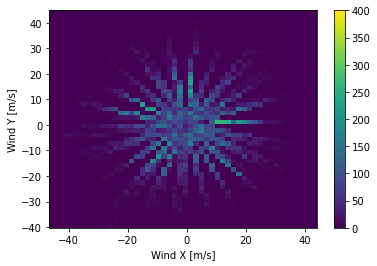

In [19]:
plt.hist2d(inData['wind_MALsin'], inData['wind_MALcos'], bins=(50, 50), vmax=400)
plt.colorbar()
plt.xlabel('Wind X [m/s]')
plt.ylabel('Wind Y [m/s]')
ax = plt.gca()
ax.axis('tight')

## Transform time into 2D

Intend to capture the seasonal pattern

In [20]:
def old_transformTimeInto2d(df):
  timestamp_s = df.date.map(datetime.timestamp)
  day = 24*60*60
  year = (365.2425)*day

  df['Day sin'] = np.sin(timestamp_s * (2 * np.pi / day))
  df['Day cos'] = np.cos(timestamp_s * (2 * np.pi / day))
  df['Year sin'] = np.sin(timestamp_s * (2 * np.pi / year))
  df['Year cos'] = np.cos(timestamp_s * (2 * np.pi / year))

  return df

In [21]:
import numpy as np
import math

def transformTimeInto2d(df):
  df['Day_inYear'] = None
  df['daysInYear'] = None
  df['radianTime'] = None
  df['radianTimeCos'] = None
  df['radianTimeSin'] = None
  df['hourCos'] = None  # newly added radian
  df['hourSin'] = None

  def check_leap(year):
    if year%4 == 0:
      return 366
    else:
      return 365

  def transformTimeInto2dRow(row):
    row['Day_inYear'] = row['date'].timetuple().tm_yday
    daysInYear = check_leap(row['year'])
    row['daysInYear'] = daysInYear
    row['radianTime'] = (row.hour + row.Day_inYear * 24 ) / (24 * daysInYear) * (2*np.pi)
    row['radianTimeCos'] = math.cos(row['radianTime'])
    row['radianTimeSin'] = math.sin(row['radianTime'])
    row['hourCos'] = math.cos(row.hour/24 * (2*np.pi))
    row['hourSin'] = math.sin(row.hour/24 * (2*np.pi))
    return row

  df = df.apply(transformTimeInto2dRow, axis='columns')
  return df

inData = transformTimeInto2d(inData)
inData.columns

Index(['Unnamed: 0', 'date', 'rain_BEL', 'temp_BEL', 'wetb_BEL', 'dewpt_BEL',
       'vappr_BEL', 'rhum_BEL', 'msl_BEL', 'wdsp_BEL', 'wddir_BEL', 'rain_DUB',
       'temp_DUB', 'wetb_DUB', 'dewpt_DUB', 'vappr_DUB', 'rhum_DUB', 'msl_DUB',
       'wdsp_DUB', 'wddir_DUB', 'ww_DUB', 'w_DUB', 'sun_DUB', 'vis_DUB',
       'clht_DUB', 'clamt_DUB', 'rain', 'temp', 'wetb', 'dewpt', 'vappr',
       'rhum', 'msl', 'wdsp', 'wddir', 'ww', 'w', 'sun', 'vis', 'clht',
       'clamt', 'rain_COR', 'temp_COR', 'wetb_COR', 'dewpt_COR', 'vappr_COR',
       'rhum_COR', 'msl_COR', 'wdsp_COR', 'wddir_COR', 'ww_COR', 'w_COR',
       'sun_COR', 'vis_COR', 'clht_COR', 'clamt_COR', 'rain_MAL', 'temp_MAL',
       'wetb_MAL', 'dewpt_MAL', 'vappr_MAL', 'rhum_MAL', 'msl_MAL', 'wdsp_MAL',
       'wddir_MAL', 'Unnamed: 0.1', 'ActualDemandMW', 'ForecastWndMW',
       'ActualWindMW', 'ActualGenerationMW', 'NetTotal_MW', 'WindMWPercent',
       'hour', 'isweekday', 'month', 'year', 'TotalWindCapacityMW',
       'WindGenPe

Text(0.5, 1.0, 'Radian time signal')

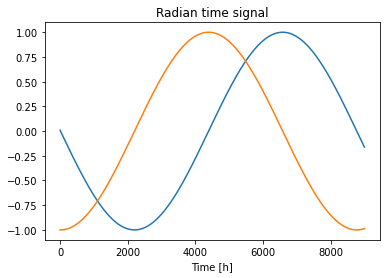

In [22]:
plt.plot(np.array(inData['radianTimeSin'])[:(24*375)])
plt.plot(np.array(inData['radianTimeCos'])[:(24*375)])
plt.xlabel('Time [h]')
plt.title('Radian time signal')

# Prep smaller dataset to run model : reduced dataset for prototype to known important factors

In [23]:
#OLD
#redds = newdf.loc[:, ['date', 'Year sin', 'Year cos',  'Day sin', 'Day cos', 'isweekday',
#                     'wdsp_BELx', 'wdsp_BELy', 'temp_BEL',
#                      'wdspx', 'wdspy','temp',
#                      'wdsp_CORx', 'wdsp_CORy', 'temp_COR',
#                      'wdsp_DUBx', 'wdsp_DUBy', 'temp_DUB', 
#                      'TotalWindCapacityMW', 'ActualWindMW', 'ForecastWndMW', 'ActualDemandMW']]

In [24]:
attrs = ['date', 'hour', 'month', 'year', 'Day_inYear',
          'wdsp_BEL', 'wddir_BEL', 'wind_BELsin', 'wind_BELcos','vappr_BEL', 'rhum_BEL', 'temp_BEL',
          'wdsp', 'wddir', 'windsin', 'windcos', 'vappr', 'rhum', 'temp', 'msl',
          'wdsp_COR', 'wddir_COR', 'wind_CORsin', 'wind_CORcos', 'vappr_COR', 'rhum_COR', 'temp_COR',
          'wdsp_DUB', 'wddir_DUB', 'wind_DUBsin', 'wind_DUBcos', 'vappr_DUB', 'rhum_DUB', 'temp_DUB',
          'wdsp_MAL', 'wddir_MAL', 'wind_MALsin', 'wind_MALcos', 'vappr_MAL', 'rhum_MAL', 'temp_MAL',
          'TotalWindCapacityMW',
          'radianTimeSin', 'radianTimeCos', 'hourSin', 'hourCos',
          'ActualWindMW', 'ActualDemandMW', 'ForecastWndMW']

dataSet = inData.loc[(inData.year>=2017) & (inData.date < max_date), attrs]

## Handle the rows with empty values

In [25]:
# CL Change : No missing data :=)
dataSet.isnull().sum()

date                   0
hour                   0
month                  0
year                   0
Day_inYear             0
wdsp_BEL               0
wddir_BEL              0
wind_BELsin            0
wind_BELcos            0
vappr_BEL              0
rhum_BEL               0
temp_BEL               0
wdsp                   0
wddir                  0
windsin                0
windcos                0
vappr                  0
rhum                   0
temp                   0
msl                    0
wdsp_COR               0
wddir_COR              0
wind_CORsin            0
wind_CORcos            0
vappr_COR              0
rhum_COR               0
temp_COR               0
wdsp_DUB               0
wddir_DUB              0
wind_DUBsin            0
wind_DUBcos            0
vappr_DUB              0
rhum_DUB               0
temp_DUB               0
wdsp_MAL               0
wddir_MAL              0
wind_MALsin            0
wind_MALcos            0
vappr_MAL              0
rhum_MAL               0


In [26]:
#dataSet.fillna(method='ffill', inplace=True)

In [27]:
# Remove the rows with empty cells
import numpy as np
eIdx = np.where(pd.isnull(dataSet))
print(eIdx[0])

print(dataSet.shape)
dataSet = dataSet.drop(eIdx[0], axis=0)
print(dataSet.shape)

[]
(32832, 49)
(32832, 49)


## Different feature sets to build different ANN models

In [28]:
# CL: 2021/04/02: remove Month as very highly correlated with Day_inYear, as well as temp other than temp_DUB
# and add 'msl' Sea Level pressure as highly predictive of upcoming storm and improve wind turbine performance
# KP: added 'hourSin', 'hourCos'
attr_basic_month = ['hour', 'month', 
              'wdsp_BEL', 'wddir_BEL', 
              'wdsp', 'wddir', 'msl',
              'wdsp_COR', 'wddir_COR',
              'wdsp_DUB', 'wddir_DUB', 'temp_DUB',
              'wdsp_MAL', 'wddir_MAL',
              'TotalWindCapacityMW']

attr_basic = ['hour', 'Day_inYear',
              'wdsp_BEL', 'wddir_BEL', 
              'wdsp', 'wddir', 'msl',
              'wdsp_COR', 'wddir_COR',
              'wdsp_DUB', 'wddir_DUB', 'temp_DUB',
              'wdsp_MAL', 'wddir_MAL',
              'TotalWindCapacityMW']

attr_rhum = ['hour', 'Day_inYear',
              'wdsp_BEL', 'wddir_BEL', 'rhum', 
              'wdsp', 'wddir', 'rhum', 'msl',
              'wdsp_COR', 'wddir_COR', 'rhum_COR',
              'wdsp_DUB', 'wddir_DUB', 'rhum_DUB', 'temp_DUB',
              'wdsp_MAL', 'wddir_MAL',
              'TotalWindCapacityMW']

attr_vappr = ['hour', 'Day_inYear',
              'wdsp_BEL', 'wddir_BEL', 'vappr_BEL', 
              'wdsp', 'wddir', 'vappr','msl', 'msl',
              'wdsp_COR', 'wddir_COR', 'vappr_COR',
              'wdsp_DUB', 'wddir_DUB', 'vappr_DUB', 'temp_DUB',
              'wdsp_MAL', 'wddir_MAL',
              'TotalWindCapacityMW']

attr_rhum_vappr = ['hour', 'Day_inYear',
                    'wdsp_BEL', 'wddir_BEL', 'rhum', 'vappr_BEL', 
                    'wdsp', 'wddir', 'rhum', 'vappr', 'msl',
                    'wdsp_COR', 'wddir_COR', 'rhum_COR', 'vappr_COR',
                    'wdsp_DUB', 'wddir_DUB', 'rhum_DUB', 'vappr_DUB', 'temp_DUB',
                    'wdsp_MAL', 'wddir_MAL',
                    'TotalWindCapacityMW']

attr_2D_wind = ['hour', 'Day_inYear',
                'wind_BELsin', 'wind_BELcos', 
                'windsin', 'windcos', 'msl',
                'wind_CORsin', 'wind_CORcos',
                'wind_DUBsin', 'wind_DUBcos', 'temp_DUB',
                'wind_MALsin', 'wind_MALcos',
                'TotalWindCapacityMW']

attr_radianTime = ['wdsp_BEL', 'wddir_BEL', 
                    'wdsp', 'wddir', 'msl',
                    'wdsp_COR', 'wddir_COR',
                    'wdsp_DUB', 'wddir_DUB', 'temp_DUB',
                    'wdsp_MAL', 'wddir_MAL',
                    'radianTimeSin', 'radianTimeCos', 'hourSin', 'hourCos',
                    'TotalWindCapacityMW']

attr_2D_wind_time = ['wind_BELsin', 'wind_BELcos', 
                      'windsin', 'windcos', 'msl',
                      'wind_CORsin', 'wind_CORcos', 
                      'wind_DUBsin', 'wind_DUBcos', 'temp_DUB', 
                      'wind_MALsin', 'wind_MALcos',
                      'radianTimeSin', 'radianTimeCos', 'hourSin', 'hourCos',
                      'TotalWindCapacityMW']


attr_rhum_time = ['wdsp_BEL', 'wddir_BEL', 'rhum_BEL',
                  'wdsp', 'wddir', 'rhum',
                  'wdsp_COR', 'wddir_COR', 'rhum_COR',
                  'wdsp_DUB', 'wddir_DUB', 'rhum_DUB', 'temp_DUB',
                  'radianTimeSin', 'radianTimeCos', 'hourSin', 'hourCos',
                  'wdsp_MAL', 'wddir_MAL', 'rhum_MAL',
                  'TotalWindCapacityMW']


attr_selections = [attr_basic_month, attr_basic, attr_rhum, attr_2D_wind, attr_radianTime, attr_2D_wind_time, attr_rhum_time]
attrSet_names = ['basic month', 'basic', 'rhum', 'wind', 'radianTime', 'wind & time', 'time & rhum']

#attr_selections = [attr_basic, attr_rhum, attr_msl, attr_rhum_msl, attr_2D_wind, attr_radianTime, attr_2D_wind_time, attr_rhum_time]
#attrSet_names = ['basic', 'rhum', 'msl', 'rhum & msl', 'wind', 'radianTime', 'wind & time', 'time & rhum']


## Correlation matrix and VIF


### Basic subset

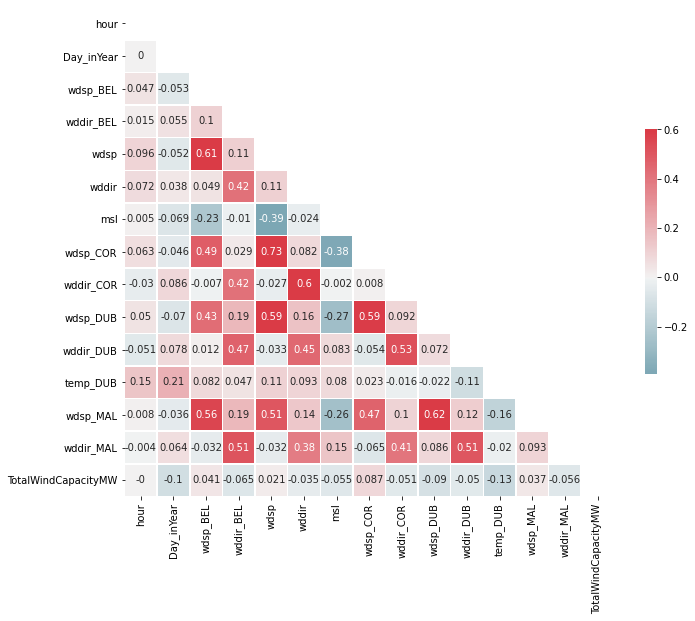

In [29]:
import seaborn as sns

num_df = dataSet.loc[:, attr_basic].select_dtypes(['int', 'float'])
# Compute the correlation matrix
corr = num_df.corr()
corr = np.round(corr, 3)
# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=np.bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=0.6, center=0, annot= True,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})


In [30]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
from patsy import dmatrices
from statsmodels.api import add_constant

num_df = add_constant(num_df)

vif = [variance_inflation_factor(num_df.to_numpy(), i) for i in range(num_df.to_numpy().shape[1])]

pd.DataFrame(num_df.iloc[:, 1:].columns, vif[1:])

,0
1.041314,hour
1.107302,Day_inYear
1.914855,wdsp_BEL
1.637972,wddir_BEL
2.995052,wdsp
1.769003,wddir
1.300278,msl
2.485045,wdsp_COR
1.868366,wddir_COR
2.224912,wdsp_DUB


### RadianTime subset

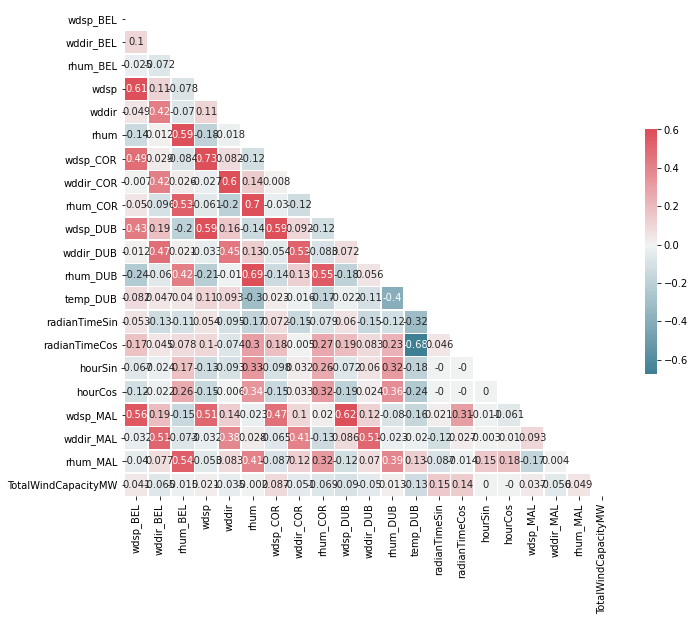

In [31]:
num_df = dataSet.loc[:, attr_rhum_time].select_dtypes(['int', 'float'])
# Compute the correlation matrix
corr = num_df.corr()
corr = np.round(corr, 3)
# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=np.bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=0.6, center=0, annot= True,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

In [32]:
num_df = add_constant(num_df)

vif = [variance_inflation_factor(num_df.to_numpy(), i) for i in range(num_df.to_numpy().shape[1])]

pd.DataFrame(num_df.iloc[:, 1:].columns, vif[1:])

,0
2.117371,wdsp_BEL
1.675135,wddir_BEL
2.143784,rhum_BEL
2.928038,wdsp
1.813861,wddir
3.601083,rhum
2.503791,wdsp_COR
1.980079,wddir_COR
2.774717,rhum_COR
2.330891,wdsp_DUB


### attr_2D_wind_time subset

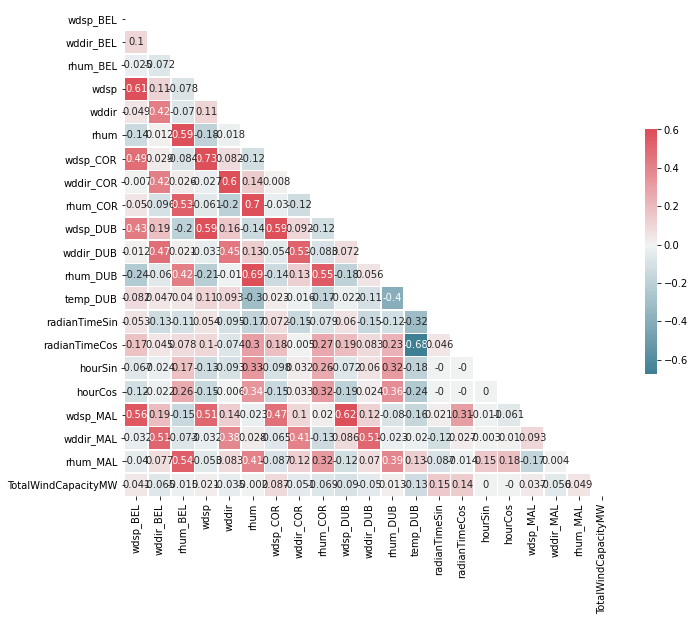

In [33]:

num_df = dataSet.loc[:, attr_rhum_time].select_dtypes(['int', 'float'])
# Compute the correlation matrix
corr = num_df.corr()
corr = np.round(corr, 3)
# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=np.bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=0.6, center=0, annot= True,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

In [34]:
num_df = add_constant(num_df)

vif = [variance_inflation_factor(num_df.to_numpy(), i) for i in range(num_df.to_numpy().shape[1])]

pd.DataFrame(num_df.iloc[:, 1:].columns, vif[1:])

,0
2.117371,wdsp_BEL
1.675135,wddir_BEL
2.143784,rhum_BEL
2.928038,wdsp
1.813861,wddir
3.601083,rhum
2.503791,wdsp_COR
1.980079,wddir_COR
2.774717,rhum_COR
2.330891,wdsp_DUB


## Hours where wind generation over 70% of demand

In [35]:
dataSet.columns

Index(['date', 'hour', 'month', 'year', 'Day_inYear', 'wdsp_BEL', 'wddir_BEL',
       'wind_BELsin', 'wind_BELcos', 'vappr_BEL', 'rhum_BEL', 'temp_BEL',
       'wdsp', 'wddir', 'windsin', 'windcos', 'vappr', 'rhum', 'temp', 'msl',
       'wdsp_COR', 'wddir_COR', 'wind_CORsin', 'wind_CORcos', 'vappr_COR',
       'rhum_COR', 'temp_COR', 'wdsp_DUB', 'wddir_DUB', 'wind_DUBsin',
       'wind_DUBcos', 'vappr_DUB', 'rhum_DUB', 'temp_DUB', 'wdsp_MAL',
       'wddir_MAL', 'wind_MALsin', 'wind_MALcos', 'vappr_MAL', 'rhum_MAL',
       'temp_MAL', 'TotalWindCapacityMW', 'radianTimeSin', 'radianTimeCos',
       'hourSin', 'hourCos', 'ActualWindMW', 'ActualDemandMW',
       'ForecastWndMW'],
      dtype='object')

In [36]:
dataSet["over70percent"] = 0

def over70percentmap(row):
  if (row.ActualWindMW > (0.7 * row.ActualDemandMW)):
    row.over70percent = 1
  return row
dataSet = dataSet.apply(over70percentmap, axis='columns')

#dataSet.over70percent.map(lambda p: 0 if (dataSet.ActualDemandMW < (0.7 * dataSet.ActualDemandMW) == True) else 1 )

In [37]:
dataSet["weekly_over70percent"] = dataSet.over70percent.rolling(7*24).mean()

In [38]:
# Perform EDA, visualize, etc...
fig = make_subplots(
    rows=1, cols=1,
    specs=[[{"secondary_y": True}]],
    subplot_titles=("Wind"))



#fig.add_trace(go.Scatter(x=dataSet['date'], y=(0.7*dataSet['ActualDemandMW']),
#                         line=dict(color='firebrick', width=1, dash='dash'), # dash options include 'dash', 'dot', and 'dashdot'
#                    name='70% Actual Demand',showlegend=True), 1, 1, secondary_y=False)


fig.add_trace(go.Scatter(x=dataSet['date'], y=dataSet['weekly_over70percent'],
                    mode='lines',
                    name='over70percent',showlegend=True), 1, 1, secondary_y=True)

fig.update_layout(
    title_text="Wind Generation (%)",
    xaxis=dict(
        showline=True,
        showgrid=False,
        showticklabels=True,
        linecolor='rgb(204, 204, 204)',
        linewidth=2,
        ticks='outside',
        tickfont=dict(
            family='Arial',
            size=12,
            color='rgb(82, 82, 82)',
        ),
    ),
    yaxis=dict(
        showgrid=False,
        zeroline=False,
        showline=False,
        showticklabels=True,
    ),
    autosize=False,
    margin=dict(
        l=100,
        r=20,
        t=110,
    ),
    plot_bgcolor='white',
    width=1000,
    height=500
)
fig.show()

# Training, Validation & Test set

In [39]:
dataSet.shape

(32832, 51)

In [40]:
dataSet.tail()

,date,hour,month,year,Day_inYear,wdsp_BEL,wddir_BEL,wind_BELsin,wind_BELcos,vappr_BEL,rhum_BEL,temp_BEL,wdsp,wddir,windsin,windcos,vappr,rhum,temp,msl,wdsp_COR,wddir_COR,wind_CORsin,wind_CORcos,vappr_COR,rhum_COR,temp_COR,wdsp_DUB,wddir_DUB,wind_DUBsin,wind_DUBcos,vappr_DUB,rhum_DUB,temp_DUB,wdsp_MAL,wddir_MAL,wind_MALsin,wind_MALcos,vappr_MAL,rhum_MAL,temp_MAL,TotalWindCapacityMW,radianTimeSin,radianTimeCos,hourSin,hourCos,ActualWindMW,ActualDemandMW,ForecastWndMW,over70percent,weekly_over70percent
32827,2021-03-29 19:00:00,19.0,3.0,2021.0,88,26,200,-22.705730,12.666880,12.0,89,11.3,10,190,9.977993,0.663069,11.0,73,13.2,1021.1,12,200,-10.479568,5.846252,11.9,97,9.9,11,200,-9.606270,5.359064,11.2,80,12.0,15,200.0,-13.099459,7.307815,12.5,85,12.7,5576.095,0.999105,0.042306,-0.965926,0.258819,3220.25,5023.00,3608.50,0,0.315476
32828,2021-03-29 20:00:00,20.0,3.0,2021.0,88,24,200,-20.959135,11.692504,12.0,90,11.1,10,190,9.977993,0.663069,11.0,76,12.4,1021.7,13,200,-11.352865,6.333440,11.7,99,9.5,10,200,-8.732973,4.871877,11.1,81,11.7,19,210.0,8.886652,-16.793672,11.9,82,12.5,5576.095,0.999135,0.041589,-0.866025,0.500000,3120.75,5090.75,3502.75,0,0.315476
32829,2021-03-29 21:00:00,21.0,3.0,2021.0,88,24,200,-20.959135,11.692504,11.9,91,10.9,5,130,-4.650530,-1.836457,11.4,82,11.9,1022.4,12,190,11.973591,0.795682,11.7,100,9.3,11,220,0.972386,10.956937,11.5,84,11.6,20,210.0,9.354370,-17.677549,11.5,80,12.3,5576.095,0.999164,0.040872,-0.707107,0.707107,3040.75,4848.25,3367.00,0,0.315476
32830,2021-03-29 22:00:00,22.0,3.0,2021.0,88,22,200,-19.212541,10.718129,12.0,91,10.9,3,110,-0.132728,-2.997062,11.6,84,11.7,1022.7,10,190,9.977993,0.663069,11.4,99,9.1,12,220,1.060785,11.953022,11.5,83,11.8,17,200.0,-14.846054,8.282190,11.5,80,12.3,5576.095,0.999193,0.040156,-0.500000,0.866025,2999.00,4351.75,3223.00,0,0.315476
32831,2021-03-29 23:00:00,23.0,3.0,2021.0,88,23,190,22.949383,1.525058,12.0,92,10.8,8,160,1.755402,-7.805035,12.0,83,12.4,1023.1,9,190,8.980194,0.596762,11.3,100,8.8,11,220,0.972386,10.956937,11.2,82,11.7,18,190.0,17.960387,1.193523,11.3,79,12.2,5576.095,0.999222,0.039439,-0.258819,0.965926,2620.50,3881.50,3067.75,0,0.315476


In [41]:
from sklearn.model_selection import train_test_split
import numpy as np

splitOption = 1 # split per day of the month


testSet = dataSet.loc[(inData.date > cutOffTestDate), :]
mainSet = dataSet.loc[(inData.date <= cutOffTestDate), :]

if (splitOption == 0):
  trainSet, validSet = train_test_split(mainSet, test_size=0.2, random_state=42)
elif (splitOption == 1):  # split per day of the month
  dataSet["dayInMonth"] = 0

  def setDayInMonth(row):
      row["dayInMonth"] = row.date.day
      return row

  dataSet = dataSet.apply(setDayInMonth, axis=1)

  trainSet = dataSet.loc[(dataSet.dayInMonth > 0) & (dataSet.dayInMonth < 23), :]
  validSet = dataSet.loc[(dataSet.dayInMonth >= 23) & (inData.date <= cutOffTestDate), :]
elif (splitOption == 2):  # split per period
  trainSet = dataSet.loc[(inData.date <= cutOffValidationDate), :]
  validSet = dataSet.loc[(inData.date > cutOffValidationDate), :]  
else:
  monthYear = []
  for y in range(2017,2021):
    for m in range(1,13):
     monthYear.append([m, y])
  trainDate, validDate = train_test_split(monthYear, test_size=0.2, random_state=42)

  trainDate = np.array(trainDate)
  validDate = np.array(validDate)

  trainSet = dataSet.loc[(dataSet.month in trainDate[:,0]) & (dataSet.year in trainDate[:,1]), :]
  validSet = dataSet.loc[(dataSet.month in validDate[:,0]) & (dataSet.year in validDate[:,1]), :]

y_train = trainSet.ActualWindMW
y_valid = validSet.ActualWindMW
y_test = testSet.ActualWindMW

In [42]:
trainSet.shape, validSet.shape, testSet.shape

((23760, 52), (8904, 52), (359, 51))

# run Random Forest For chosen subset (defined in attrSet var)

In [43]:
attrSet_names

['basic month',
 'basic',
 'rhum',
 'wind',
 'radianTime',
 'wind & time',
 'time & rhum']

In [44]:
attrSet = attr_rhum_time
attrSet_name = 'time & rhum'

In [45]:
attrSet_name

'time & rhum'

In [46]:
from sklearn.model_selection import train_test_split

X_train_full = trainSet.loc[:, attrSet]
X_valid_full = validSet.loc[:, attrSet]
X_test_full = testSet.loc[:, attrSet]


# "Cardinality" means the number of unique values in a column
# Select categorical columns with relatively low cardinality (convenient but arbitrary)
categorical_cols = [cname for cname in X_train_full.columns if
                    X_train_full[cname].nunique() < 10 and 
                    X_train_full[cname].dtype == "object"]

# Select numerical columns
numerical_cols = [cname for cname in X_train_full.columns if 
                X_train_full[cname].dtype in ['int64', 'float64', 'bool']]

# Keep selected columns only
my_cols = categorical_cols + numerical_cols
X_train = X_train_full[my_cols].copy()
X_valid = X_valid_full[my_cols].copy()


In [47]:
X_train_full.shape, X_valid_full.shape

((23760, 21), (8904, 21))

In [48]:
y_train.shape , X_train.shape, y_valid.shape, X_valid.shape

((23760,), (23760, 21), (8904,), (8904, 21))

In [49]:
X_train.columns

Index(['wdsp_BEL', 'wddir_BEL', 'rhum_BEL', 'wdsp', 'wddir', 'rhum',
       'wdsp_COR', 'wddir_COR', 'rhum_COR', 'wdsp_DUB', 'wddir_DUB',
       'rhum_DUB', 'temp_DUB', 'radianTimeSin', 'radianTimeCos', 'hourSin',
       'hourCos', 'wdsp_MAL', 'wddir_MAL', 'rhum_MAL', 'TotalWindCapacityMW'],
      dtype='object')

## Run model with Performance metrics :  mean_absolute_error, mean_squared_error, r2_score

In [50]:
#from sklearn.metrics import mean_absolute_percentage_error

In [51]:
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder
from sklearn.ensemble import RandomForestRegressor

# Preprocessing for numerical data
numerical_transformer = SimpleImputer(strategy='constant')

# Preprocessing for categorical data
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

# Bundle preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)
    ])

# Define model
model = RandomForestRegressor(n_estimators=200, random_state=0)

# Bundle preprocessing and modeling code in a pipeline
clf = Pipeline(steps=[('preprocessor', preprocessor),
                      ('model', model)
                     ])



In [52]:
model.get_params()

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'criterion': 'mse',
 'max_depth': None,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 200,
 'n_jobs': None,
 'oob_score': False,
 'random_state': 0,
 'verbose': 0,
 'warm_start': False}

In [53]:
# Preprocessing of training data, fit model 
clf.fit(X_train, y_train)

Pipeline(memory=None,
         steps=[('preprocessor',
                 ColumnTransformer(n_jobs=None, remainder='drop',
                                   sparse_threshold=0.3,
                                   transformer_weights=None,
                                   transformers=[('num',
                                                  SimpleImputer(add_indicator=False,
                                                                copy=True,
                                                                fill_value=None,
                                                                missing_values=nan,
                                                                strategy='constant',
                                                                verbose=0),
                                                  ['wdsp_BEL', 'wddir_BEL',
                                                   'rhum_BEL', 'wdsp', 'wddir',
                                                   'rhum', 'wd

In [54]:
# dataframes to store results
df_results = pd.DataFrame(index = ['attrSet', 'algorithm',  
                                   'Valid MAE', 'Valid RMSE', 'Valid explained_variance_score', 
                                   'Test MAE', 'Test RMSE', 'Test explained_variance_score'])

In [55]:
#from sklearn.metrics import mean_absolute_percentage_error
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, explained_variance_score 


# Preprocessing of validation data, get predictions
preds = clf.predict(X_valid)

df_results[attrSet_name, 'Random Forest']= [attrSet_name, 'Random Forest', 
                                            mean_absolute_error(y_valid, preds), 
                                            np.sqrt(mean_squared_error(y_valid, preds)), 
                                            explained_variance_score(y_valid, preds), 0, 0, 0]


print('Validation MAE:', mean_absolute_error(y_valid, preds))
#print('mean_absolute_percentage_error: ', mean_absolute_percentage_error(y_valid, preds))
print('RMSE:', np.sqrt(mean_squared_error(y_valid, preds))) 
#print('r2_score:', r2_score(y_valid, preds))
print('explained_variance_score:', explained_variance_score(y_valid, preds))

df_results

Validation MAE: 247.2738013814016
RMSE: 326.41492839798156
explained_variance_score: 0.8807672653443822


,"(time & rhum, Random Forest)"
attrSet,time & rhum
algorithm,Random Forest
Valid MAE,247.274
Valid RMSE,326.415
Valid explained_variance_score,0.880767
Test MAE,0
Test RMSE,0
Test explained_variance_score,0


In [56]:
validLen = y_valid.shape[0]
preds.shape[0], y_valid.shape[0]

(8904, 8904)

In [57]:
df_results['N/A', 'Eirgrid']= ['N/A', 'Eirgrid', 
                               mean_absolute_error(y_valid, validSet.ForecastWndMW), 
                               np.sqrt(mean_squared_error(y_valid, validSet.ForecastWndMW)), 
                               explained_variance_score(y_valid, validSet.ForecastWndMW), 0, 0, 0 ]

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


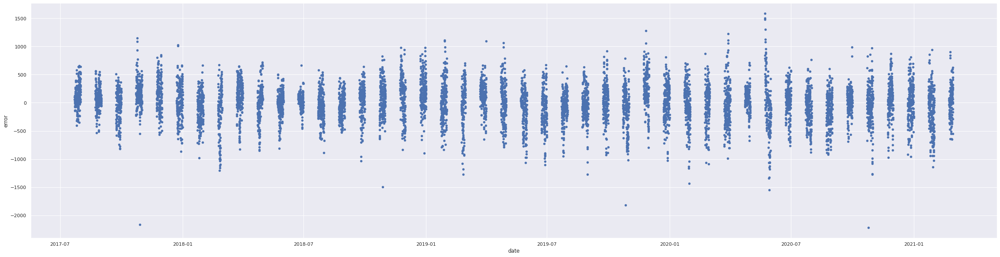

In [58]:
# Plot validation set error
dataSet['error']= preds - y_valid

sns.set()
%matplotlib inline
dataSet.plot.scatter(x='date', y='error', figsize=(40, 10))

In [59]:
dataSet['error'].describe()

count    8904.000000
mean        4.418314
std       326.403354
min     -2213.011250
25%      -179.624688
50%        34.206250
75%       199.690938
max      1582.062500
Name: error, dtype: float64

 Errors on the validation set accross the last 3 years are quite uniform , except around April 2020 when lockdown was introduced and usage patterns understandbly changed dramatically!


In [60]:
# Perform EDA, visualize, etc...
fig = make_subplots(
    rows=1, cols=1,
    specs=[[{"secondary_y": True}]],
    subplot_titles=("Wind"))

fig.add_trace(go.Scatter(x=dataSet['date'], y=dataSet['ForecastWndMW'],
                    mode='lines',
                    name='Eirgrid Forecast Wnd',showlegend=True), 1, 1, secondary_y=False)

#fig.add_trace(go.Scatter(x=dataSet['date'], y=dataSet['ActualDemandMW'],
#                    mode='lines',
#                    name='Demand Actual',showlegend=True), 1, 1, secondary_y=False)

fig.add_trace(go.Scatter(x=dataSet['date'], y=dataSet['ActualWindMW'],
                    mode='lines',
                    name='Wind Actual',showlegend=True), 1, 1, secondary_y=False)


fig.add_trace(go.Scatter(x=dataSet['date'], y=(0.7*dataSet['ActualDemandMW']),
                         line=dict(color='firebrick', width=1, dash='dash'), # dash options include 'dash', 'dot', and 'dashdot'
                    name='70% Actual Demand',showlegend=True), 1, 1, secondary_y=False)

fig.add_trace(go.Scatter(x=validSet['date'], y=preds,
                    line=dict(color='green', width=3),
                    name='Pred',showlegend=True), 1, 1, secondary_y=False)



fig.update_layout(
    title_text="Wind actual (blue) vs. Predictions (red) for days 22nd and above each month",
    xaxis=dict(
        showline=True,
        showgrid=False,
        showticklabels=True,
        linecolor='rgb(204, 204, 204)',
        linewidth=2,
        ticks='outside',
        tickfont=dict(
            family='Arial',
            size=12,
            color='rgb(82, 82, 82)',
        ),
    ),
    yaxis=dict(
        showgrid=False,
        zeroline=False,
        showline=False,
        showticklabels=True,
    ),
    autosize=False,
    margin=dict(
        l=100,
        r=20,
        t=110,
    ),
    plot_bgcolor='white',
    width=4000,
    height=500
)
fig.show()

## Metrics for last 2 weeks (Test set)

In [61]:
X_test_full.columns

Index(['wdsp_BEL', 'wddir_BEL', 'rhum_BEL', 'wdsp', 'wddir', 'rhum',
       'wdsp_COR', 'wddir_COR', 'rhum_COR', 'wdsp_DUB', 'wddir_DUB',
       'rhum_DUB', 'temp_DUB', 'radianTimeSin', 'radianTimeCos', 'hourSin',
       'hourCos', 'wdsp_MAL', 'wddir_MAL', 'rhum_MAL', 'TotalWindCapacityMW'],
      dtype='object')

In [62]:
X_train.columns

Index(['wdsp_BEL', 'wddir_BEL', 'rhum_BEL', 'wdsp', 'wddir', 'rhum',
       'wdsp_COR', 'wddir_COR', 'rhum_COR', 'wdsp_DUB', 'wddir_DUB',
       'rhum_DUB', 'temp_DUB', 'radianTimeSin', 'radianTimeCos', 'hourSin',
       'hourCos', 'wdsp_MAL', 'wddir_MAL', 'rhum_MAL', 'TotalWindCapacityMW'],
      dtype='object')

In [63]:
X_test_full

,wdsp_BEL,wddir_BEL,rhum_BEL,wdsp,wddir,rhum,wdsp_COR,wddir_COR,rhum_COR,wdsp_DUB,wddir_DUB,rhum_DUB,temp_DUB,radianTimeSin,radianTimeCos,hourSin,hourCos,wdsp_MAL,wddir_MAL,rhum_MAL,TotalWindCapacityMW
32473,8,280,84,8,250,86,9,300,79,12,280,94,7.9,0.956444,0.291914,0.258819,0.965926,15,290.0,85,5576.095
32474,8,270,90,6,240,96,8,280,83,15,290,94,7.8,0.956654,0.291228,0.500000,0.866025,17,300.0,85,5576.095
32475,4,250,94,6,230,99,8,250,84,11,280,96,7.7,0.956862,0.290542,0.707107,0.707107,14,290.0,87,5576.095
32476,6,260,95,8,240,96,10,260,87,13,280,90,7.9,0.957070,0.289856,0.866025,0.500000,13,290.0,88,5576.095
32477,8,260,96,9,250,96,7,280,90,14,280,91,6.9,0.957278,0.289169,0.965926,0.258819,12,290.0,89,5576.095
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32827,26,200,89,10,190,73,12,200,97,11,200,80,12.0,0.999105,0.042306,-0.965926,0.258819,15,200.0,85,5576.095
32828,24,200,90,10,190,76,13,200,99,10,200,81,11.7,0.999135,0.041589,-0.866025,0.500000,19,210.0,82,5576.095
32829,24,200,91,5,130,82,12,190,100,11,220,84,11.6,0.999164,0.040872,-0.707107,0.707107,20,210.0,80,5576.095
32830,22,200,91,3,110,84,10,190,99,12,220,83,11.8,0.999193,0.040156,-0.500000,0.866025,17,200.0,80,5576.095


In [64]:
# Preprocessing of validation data, get predictions
test_preds = clf.predict(X_test_full)

print('MAE:', mean_absolute_error(y_test, test_preds))
print('RMSE:', np.sqrt(mean_squared_error(y_test, test_preds))) 
print('Test r2_score:', r2_score(y_test, test_preds))
print('explained_variance_score:', explained_variance_score(y_test, test_preds))

MAE: 230.65623259052924
RMSE: 345.0476921403533
Test r2_score: 0.9150223556188877
explained_variance_score: 0.9360024144354183


In [65]:
# Perform EDA, visualize, etc...
fig = make_subplots(
    rows=1, cols=1,
    specs=[[{"secondary_y": True}]],
    subplot_titles=("Wind"))

fig.add_trace(go.Scatter(x=testSet['date'], y=testSet['ForecastWndMW'],
                    mode='lines',
                    name='Eirgrid Forecast Wnd',showlegend=True), 1, 1, secondary_y=False)

#fig.add_trace(go.Scatter(x=testSet['date'], y=testSet['ActualDemandMW'],
#                    mode='lines', name='Eirgrid Actual Demand',showlegend=True), 1, 1, secondary_y=False)

fig.add_trace(go.Scatter(x=testSet['date'], y=(0.7*testSet['ActualDemandMW']),
                         line=dict(color='firebrick', width=1, dash='dash'), # dash options include 'dash', 'dot', and 'dashdot'
                    name='70% Actual Demand',showlegend=True), 1, 1, secondary_y=False)

fig.add_trace(go.Scatter(x=testSet['date'], y=testSet['ActualWindMW'],
                    mode='lines',
                    name='Wind Actual',showlegend=True), 1, 1, secondary_y=False)

fig.add_trace(go.Scatter(x=testSet['date'], y=test_preds,
                    mode='lines',
                    name='Pred',showlegend=True), 1, 1, secondary_y=False)


fig.update_layout(
    title_text="Wind actual (blue) vs. Predictions (red) for last 2 weeks (test set)",
    xaxis=dict(
        showline=True,
        showgrid=False,
        showticklabels=True,
        linecolor='rgb(204, 204, 204)',
        linewidth=2,
        ticks='outside',
        tickfont=dict(
            family='Arial',
            size=12,
            color='rgb(82, 82, 82)',
        ),
    ),
    yaxis=dict(
        showgrid=False,
        zeroline=False,
        showline=False,
        showticklabels=True,
    ),
    autosize=False,
    margin=dict(
        l=100,
        r=20,
        t=110,
    ),
    plot_bgcolor='white',
    width=1400,
    height=800
)
fig.show()

In [66]:

df_results['N/A', 'Eirgrid']['Test MAE'] = mean_absolute_error(testSet.ActualWindMW, testSet.ForecastWndMW) 
df_results['N/A', 'Eirgrid']['Test RMSE'] = np.sqrt(mean_squared_error(testSet.ActualWindMW, testSet.ForecastWndMW)) 
df_results['N/A', 'Eirgrid']['Test explained_variance_score'] = explained_variance_score(testSet.ActualWindMW, testSet.ForecastWndMW)

print("---------------------")

df_results[attrSet_name, 'Random Forest']['Test MAE'] = mean_absolute_error(testSet.ActualWindMW, test_preds ) 
df_results[attrSet_name, 'Random Forest']['Test RMSE'] = np.sqrt(mean_squared_error(testSet.ActualWindMW, test_preds)) 
df_results[attrSet_name, 'Random Forest']['Test explained_variance_score'] = explained_variance_score(testSet.ActualWindMW, test_preds)


df_results

---------------------


,"(time & rhum, Random Forest)","(N/A, Eirgrid)"
attrSet,time & rhum,N/A
algorithm,Random Forest,Eirgrid
Valid MAE,247.274,214.577
Valid RMSE,326.415,347.138
Valid explained_variance_score,0.880767,0.866663
Test MAE,230.656,345.659
Test RMSE,345.048,522.692
Test explained_variance_score,0.936002,0.85749


## Model features importance

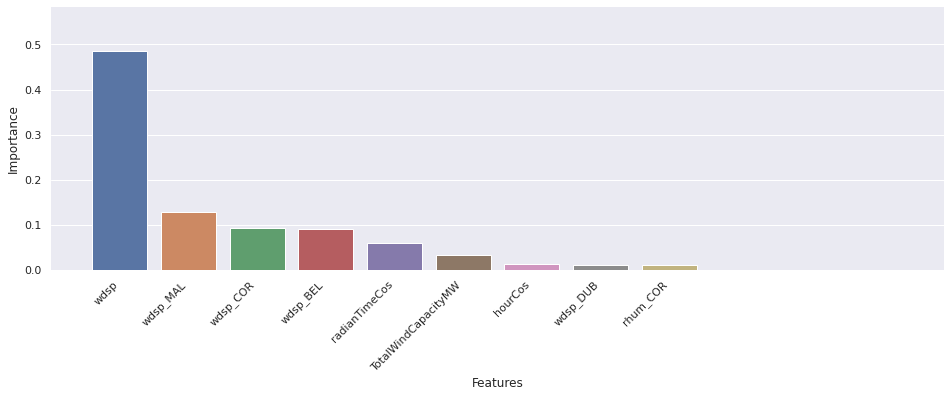

In [67]:
X_cols = X_valid.columns

rfc_fi = pd.DataFrame({'cols':X_cols, 'imp':model.feature_importances_}
                       ).sort_values('imp', ascending=False)

f, ax = plt.subplots(figsize=(16, 5))

chart = sns.barplot(x="cols", y="imp", data=(rfc_fi.loc[rfc_fi.imp > 0.01]))

# Add a legend and informative axis label
ax.set(xlim=(-1, 12), ylabel="Importance",
       xlabel="Features")
sns.despine(left=True, bottom=True)
chart.set_xticklabels(chart.get_xticklabels(), rotation=45, horizontalalignment='right')

# Pad margins so that markers don't get clipped by the axes
plt.margins(0.2)
# Tweak spacing to prevent clipping of tick-labels
plt.subplots_adjust(bottom=0.15)
plt.show()

In [68]:
rfc_fi

,cols,imp
3,wdsp,0.485996
17,wdsp_MAL,0.129193
6,wdsp_COR,0.093043
0,wdsp_BEL,0.090577
14,radianTimeCos,0.058401
20,TotalWindCapacityMW,0.033666
16,hourCos,0.011889
9,wdsp_DUB,0.011514
8,rhum_COR,0.010021
13,radianTimeSin,0.008613


# Met Éireann Weather Forecast API
Published by: Met Éireann
 32 
Licensed under: Met Eireann Custom Open Data Licence
https://data.gov.ie/dataset/met-eireann-weather-forecast-api/resource/027da6d5-d819-48d1-9b16-331dba169bd1

In [69]:

from xml.dom.minidom import parse
import xml.dom.minidom


In [70]:
def getWeather(lat, long, name):

    url = "http://metwdb-openaccess.ichec.ie/metno-wdb2ts/locationforecast?lat={};long={}".format(lat, long)
    s = requests.get(url).content

    DOMTree = xml.dom.minidom.parse(io.StringIO(s.decode('utf-8')))

    collection = DOMTree.documentElement
    if collection.hasAttribute("shelf"):
       print ("Root element : ", collection.getAttribute("shelf"))

    # Get all the movies in the collection
    product = collection.getElementsByTagName("product")

    df_cols = ['date', 'wddir', 'wdsp', 'temp', 'msl', 'rhum']
    rows = []

    product = collection.getElementsByTagName("product")
    timefcs = collection.getElementsByTagName("time")


    # Print detail of each movie.
    for timefc in timefcs:
        if timefc.hasAttribute("from"):
            fromtime =""
            wdeg = None
            wsp = None
            temp = None
            msl = None
            rhum = None

            #print ("from: ", timefc.getAttribute("from"))
            fromtime = timefc.getAttribute("from")

            location = timefc.getElementsByTagName('location')[0]

            if (len(location.getElementsByTagName('windDirection')) > 0 ):
                wd = location.getElementsByTagName('windDirection')[0]
                if wd.hasAttribute("deg"):
                    wdeg = float(wd.getAttribute("deg"))
                    #print ("Wi)nd Direction deg: ", wd.getAttribute("deg"))    

            if (len(location.getElementsByTagName('windSpeed')) > 0):
                wsp = location.getElementsByTagName('windSpeed')[0]
                if wsp.hasAttribute("mps"):
                    wsp = float(wsp.getAttribute("mps"))

            if (len(location.getElementsByTagName('pressure')) > 0):
                msl = location.getElementsByTagName('pressure')[0]
                if msl.hasAttribute("value"):
                    msl = float(msl.getAttribute("value"))

            if (len(location.getElementsByTagName('humidity')) > 0):
                rhum = location.getElementsByTagName('humidity')[0]
                if rhum.hasAttribute("value"):
                    rhum = float(rhum.getAttribute("value"))

            if (len(location.getElementsByTagName('temperature')) > 0):
                temp = location.getElementsByTagName('temperature')[0]
                if temp.hasAttribute("value"):
                    temp = float(temp.getAttribute("value"))
        #print ("From: " + fromtime + " Wind Direction deg: " + str(wdeg) + " Wind Speed mps: " + str(wsp))    
        if (wdeg != None):
            rows.append({"date": fromtime, "wddir": wdeg, "wdsp": wsp, "temp": temp, "msl": msl, "rhum": rhum})


    # <windDirection id="dd" deg="348.0" name="N"/>
    # <windSpeed id="ff" mps="3.2" beaufort="2" name="Svak vind"/>


    out_df = pd.DataFrame(rows, columns = df_cols)
    
    out_df["date"] = pd.to_datetime(out_df["date"], infer_datetime_format=True, errors='ignore')

    #out_df.to_csv(name + "weather.csv")

    return out_df

In [71]:
# Belmullet: 54.225, -9.991
lat=54.225
long=-9.991

BELMULLETds = getWeather(lat, long, "Belmullet")

In [72]:
# Cork Airport: 51.8382 Longitude: -8.4880
lat= 51.8382
long= -8.4880

corkairportds = getWeather(lat, long, "Cork")

In [73]:
# Shannon Airport, Ireland. Latitude: 52.7012 Longitude: -8.9215.
lat= 52.7012
long= -8.9215

shannonairportds = getWeather(lat, long, "Shannon")

In [74]:
# Dublin Airport in Ireland. Latitude: 53.4264 Longitude: -6.2499
lat= 53.4264
long= -6.2499

dublinairportds = getWeather(lat, long, "Dublin")

In [75]:
# Malin Head:  55.3833318 -7.3666652
lat=55.3833318
long=-7.3666652

MALds = getWeather(lat, long, "Malin Head")

In [76]:
left = BELMULLETds.set_index(['date']).copy()
right = dublinairportds.set_index(['date'])
#right.index = right.index.tz_convert(None)

wfds = left.join(right, lsuffix="_BEL", rsuffix="_DUB")

right = shannonairportds.set_index(['date'])
wfds = wfds.join(right, lsuffix="", rsuffix="_SHA")

right = corkairportds.set_index(['date'])
wfds = wfds.join(right, lsuffix="", rsuffix="_COR")

right = MALds.set_index(['date'])
wfds = wfds.join(right, lsuffix="", rsuffix="_MAL")

wfds = wfds.reset_index()


In [77]:
# Perform EDA, visualize, etc...
fig = make_subplots(
    rows=1, cols=1,
    specs=[[{"secondary_y": True}]],
    subplot_titles=("Met Station"))


fig.add_trace(go.Scatter(x=wfds['date'], y=wfds['wdsp_BEL'],
                    mode='lines',
                    name='Belmullet Wind Speed',showlegend=True), 1, 1, secondary_y=False)

fig.add_trace(go.Scatter(x=wfds['date'], y=wfds['wdsp_COR'],
                    mode='lines',
                    name='Cork Airport Wind Speed',showlegend=True), 1, 1, secondary_y=False)

fig.add_trace(go.Scatter(x=wfds['date'], y=wfds['wdsp'],
                    mode='lines',
                    name='Shannon Airport Wind Speed',showlegend=True), 1, 1, secondary_y=False)
fig.add_trace(go.Scatter(x=wfds['date'], y=wfds['wdsp_DUB'],
                    mode='lines',
                    name='Dublin Airport Wind Speed',showlegend=True), 1, 1, secondary_y=False)
fig.add_trace(go.Scatter(x=wfds['date'], y=wfds['wdsp_MAL'],
                    mode='lines',
                    name='Malin head Wind Speed',showlegend=True), 1, 1, secondary_y=False)

fig.update_layout(
    title_text="Wind speed ",
    xaxis=dict(
        showline=True,
        showgrid=False,
        showticklabels=True,
        linecolor='rgb(204, 204, 204)',
        linewidth=2,
        ticks='outside',
        tickfont=dict(
            family='Arial',
            size=12,
            color='rgb(82, 82, 82)',
        ),
    ),
    yaxis=dict(
        showgrid=False,
        zeroline=False,
        showline=False,
        showticklabels=True,
    ),
    autosize=False,
    margin=dict(
        l=100,
        r=20,
        t=110,
    ),
    plot_bgcolor='white',
    width=1400,
    height=500
)
fig.show()

In [78]:
# Weather Hourly data wind speed in knt, for some reason, 1 knt = 0.514 m/s
knot = 0.514
wfds.wdsp_BEL = wfds.wdsp_BEL / knot
wfds.wdsp = wfds.wdsp / knot
wfds.wdsp_COR = wfds.wdsp_COR / knot
wfds.wdsp_DUB = wfds.wdsp_DUB / knot
wfds.wdsp_MAL = wfds.wdsp_MAL / knot

In [79]:
fig = go.Figure()
fig.add_trace(go.Box(y=newdf['wdsp_BEL'], name='BEL'))
fig.add_trace(go.Box(y=wfds['wdsp_BEL'], name='BEL forecast'))
fig.add_trace(go.Box(y=newdf['wdsp_DUB'], name = 'DUB'))
fig.add_trace(go.Box(y=wfds['wdsp_DUB'], name='DUB forecast'))
fig.add_trace(go.Box(y=newdf['wdsp'], name = 'SHA'))
fig.add_trace(go.Box(y=wfds['wdsp'], name='SHA forecast'))

fig.add_trace(go.Box(y=newdf['wdsp_COR'], name = 'CORK'))
fig.add_trace(go.Box(y=wfds['wdsp_COR'], name='CORK forecast'))

fig.add_trace(go.Box(y=newdf['wdsp_MAL'], name = 'MALIN Head'))
fig.add_trace(go.Box(y=wfds['wdsp_MAL'], name='Malin forecast'))
fig.show()

In [80]:
fig = go.Figure()
fig.add_trace(go.Box(y=newdf['rhum_BEL'], name='BEL'))
fig.add_trace(go.Box(y=wfds['rhum_BEL'], name='BEL forecast'))
fig.add_trace(go.Box(y=newdf['rhum_DUB'], name = 'DUB'))
fig.add_trace(go.Box(y=wfds['rhum_DUB'], name='DUB forecast'))
fig.add_trace(go.Box(y=newdf['rhum'], name = 'SHA'))
fig.add_trace(go.Box(y=wfds['rhum'], name='SHA forecast'))

fig.add_trace(go.Box(y=newdf['rhum_COR'], name = 'CORK'))
fig.add_trace(go.Box(y=wfds['rhum_COR'], name='CORK forecast'))

fig.add_trace(go.Box(y=newdf['rhum_MAL'], name = 'MALIN Head'))
fig.add_trace(go.Box(y=wfds['rhum_MAL'], name='Malin forecast'))
fig.show()

# Run predictions 

In [81]:
wfds.columns

Index(['date', 'wddir_BEL', 'wdsp_BEL', 'temp_BEL', 'msl_BEL', 'rhum_BEL',
       'wddir_DUB', 'wdsp_DUB', 'temp_DUB', 'msl_DUB', 'rhum_DUB', 'wddir',
       'wdsp', 'temp', 'msl', 'rhum', 'wddir_COR', 'wdsp_COR', 'temp_COR',
       'msl_COR', 'rhum_COR', 'wddir_MAL', 'wdsp_MAL', 'temp_MAL', 'msl_MAL',
       'rhum_MAL'],
      dtype='object')

In [82]:
X_train.columns

Index(['wdsp_BEL', 'wddir_BEL', 'rhum_BEL', 'wdsp', 'wddir', 'rhum',
       'wdsp_COR', 'wddir_COR', 'rhum_COR', 'wdsp_DUB', 'wddir_DUB',
       'rhum_DUB', 'temp_DUB', 'radianTimeSin', 'radianTimeCos', 'hourSin',
       'hourCos', 'wdsp_MAL', 'wddir_MAL', 'rhum_MAL', 'TotalWindCapacityMW'],
      dtype='object')

In [83]:
wfds["hour"] = 0
wfds["isweekday"] = False
wfds["month"] = 0
wfds['year'] = 0
wfds["day"] = 0
wfds['TotalWindCapacityMW'] = latestWindCapacityMW
def settimeattfull(row):
    row["hour"] = row.date.hour
    row["isweekday"] = (row.date.isoweekday() < 6) 
    row["month"] = row.date.month
    row["year"] = row.date.year
    row["day"] = row.date.day
    return row

wfds = wfds.apply(settimeattfull, axis='columns')

In [84]:
wfds = transformTimeInto2d(wfds)
wfds.columns

Index(['date', 'wddir_BEL', 'wdsp_BEL', 'temp_BEL', 'msl_BEL', 'rhum_BEL',
       'wddir_DUB', 'wdsp_DUB', 'temp_DUB', 'msl_DUB', 'rhum_DUB', 'wddir',
       'wdsp', 'temp', 'msl', 'rhum', 'wddir_COR', 'wdsp_COR', 'temp_COR',
       'msl_COR', 'rhum_COR', 'wddir_MAL', 'wdsp_MAL', 'temp_MAL', 'msl_MAL',
       'rhum_MAL', 'hour', 'isweekday', 'month', 'year', 'day',
       'TotalWindCapacityMW', 'Day_inYear', 'daysInYear', 'radianTime',
       'radianTimeCos', 'radianTimeSin', 'hourCos', 'hourSin'],
      dtype='object')

In [85]:
wfds = transformWindInto2d(wfds)
wfds.columns

Index(['date', 'wddir_BEL', 'wdsp_BEL', 'temp_BEL', 'msl_BEL', 'rhum_BEL',
       'wddir_DUB', 'wdsp_DUB', 'temp_DUB', 'msl_DUB', 'rhum_DUB', 'wddir',
       'wdsp', 'temp', 'msl', 'rhum', 'wddir_COR', 'wdsp_COR', 'temp_COR',
       'msl_COR', 'rhum_COR', 'wddir_MAL', 'wdsp_MAL', 'temp_MAL', 'msl_MAL',
       'rhum_MAL', 'hour', 'isweekday', 'month', 'year', 'day',
       'TotalWindCapacityMW', 'Day_inYear', 'daysInYear', 'radianTime',
       'radianTimeCos', 'radianTimeSin', 'hourCos', 'hourSin', 'wind_CORsin',
       'wind_CORcos', 'wind_DUBsin', 'wind_DUBcos', 'wind_BELsin',
       'wind_BELcos', 'windsin', 'windcos', 'wind_MALsin', 'wind_MALcos'],
      dtype='object')

In [86]:
redtds = wfds.loc[ : , attrSet]


In [87]:
redtds

,wdsp_BEL,wddir_BEL,rhum_BEL,wdsp,wddir,rhum,wdsp_COR,wddir_COR,rhum_COR,wdsp_DUB,wddir_DUB,rhum_DUB,temp_DUB,radianTimeSin,radianTimeCos,hourSin,hourCos,wdsp_MAL,wddir_MAL,rhum_MAL,TotalWindCapacityMW
0,9.143969,326.3,72.9,2.140078,47.7,84.5,4.280156,115.0,94.5,10.311284,286.9,55.1,14.5,0.595879,-0.803074,5.000000e-01,-8.660254e-01,15.564202,336.2,73.9,5576.095
1,8.754864,331.2,70.4,1.945525,59.9,83.7,5.642023,79.8,96.0,9.727626,292.8,50.4,15.6,0.595303,-0.803501,2.588190e-01,-9.659258e-01,15.564202,335.2,73.1,5576.095
2,7.782101,335.1,74.4,1.361868,219.3,81.4,5.058366,68.6,95.0,9.338521,289.3,49.7,15.9,0.594727,-0.803928,1.224647e-16,-1.000000e+00,15.758755,331.9,72.2,5576.095
3,8.171206,6.3,75.7,4.474708,267.1,79.9,4.280156,41.0,93.0,8.754864,291.7,50.4,15.5,0.594150,-0.804354,-2.588190e-01,-9.659258e-01,14.785992,327.3,73.4,5576.095
4,10.311284,4.4,70.1,5.058366,261.6,76.5,3.112840,14.6,90.1,7.782101,310.6,51.7,15.9,0.593573,-0.804780,-5.000000e-01,-8.660254e-01,15.758755,320.7,74.2,5576.095
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
110,9.533074,297.6,82.1,5.058366,253.0,89.0,5.642023,283.5,88.7,7.198444,264.0,88.6,8.6,0.471160,-0.882048,0.000000e+00,1.000000e+00,7.587549,220.6,84.0,5576.095
111,11.478599,314.1,88.8,7.198444,289.6,86.8,7.198444,281.2,84.2,8.560311,260.8,87.2,8.0,0.467359,-0.884068,1.000000e+00,6.123234e-17,6.614786,271.9,82.4,5576.095
112,13.229572,316.4,79.5,11.478599,303.2,64.5,11.284047,295.7,70.3,7.392996,283.2,62.2,13.9,0.463550,-0.886071,1.224647e-16,-1.000000e+00,10.700389,313.7,73.9,5576.095
113,14.785992,318.4,76.7,12.062257,305.5,68.9,11.478599,309.4,63.1,5.836576,292.5,72.0,12.1,0.459733,-0.888057,-1.000000e+00,-1.836970e-16,13.229572,311.6,75.8,5576.095


In [88]:
redtds.columns

Index(['wdsp_BEL', 'wddir_BEL', 'rhum_BEL', 'wdsp', 'wddir', 'rhum',
       'wdsp_COR', 'wddir_COR', 'rhum_COR', 'wdsp_DUB', 'wddir_DUB',
       'rhum_DUB', 'temp_DUB', 'radianTimeSin', 'radianTimeCos', 'hourSin',
       'hourCos', 'wdsp_MAL', 'wddir_MAL', 'rhum_MAL', 'TotalWindCapacityMW'],
      dtype='object')

In [89]:
X_valid.columns

Index(['wdsp_BEL', 'wddir_BEL', 'rhum_BEL', 'wdsp', 'wddir', 'rhum',
       'wdsp_COR', 'wddir_COR', 'rhum_COR', 'wdsp_DUB', 'wddir_DUB',
       'rhum_DUB', 'temp_DUB', 'radianTimeSin', 'radianTimeCos', 'hourSin',
       'hourCos', 'wdsp_MAL', 'wddir_MAL', 'rhum_MAL', 'TotalWindCapacityMW'],
      dtype='object')

In [90]:
redtds.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 115 entries, 0 to 114
Data columns (total 21 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   wdsp_BEL             115 non-null    float64
 1   wddir_BEL            115 non-null    float64
 2   rhum_BEL             115 non-null    float64
 3   wdsp                 115 non-null    float64
 4   wddir                115 non-null    float64
 5   rhum                 115 non-null    float64
 6   wdsp_COR             115 non-null    float64
 7   wddir_COR            115 non-null    float64
 8   rhum_COR             115 non-null    float64
 9   wdsp_DUB             115 non-null    float64
 10  wddir_DUB            115 non-null    float64
 11  rhum_DUB             115 non-null    float64
 12  temp_DUB             115 non-null    float64
 13  radianTimeSin        115 non-null    float64
 14  radianTimeCos        115 non-null    float64
 15  hourSin              115 non-null    flo

In [91]:
X_valid.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8904 entries, 528 to 32135
Data columns (total 21 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   wdsp_BEL             8904 non-null   int64  
 1   wddir_BEL            8904 non-null   int64  
 2   rhum_BEL             8904 non-null   int64  
 3   wdsp                 8904 non-null   int64  
 4   wddir                8904 non-null   int64  
 5   rhum                 8904 non-null   int64  
 6   wdsp_COR             8904 non-null   int64  
 7   wddir_COR            8904 non-null   int64  
 8   rhum_COR             8904 non-null   int64  
 9   wdsp_DUB             8904 non-null   int64  
 10  wddir_DUB            8904 non-null   int64  
 11  rhum_DUB             8904 non-null   int64  
 12  temp_DUB             8904 non-null   float64
 13  radianTimeSin        8904 non-null   float64
 14  radianTimeCos        8904 non-null   float64
 15  hourSin              8904 non-null 

In [92]:

# Preprocessing of validation data, get predictions
preds = clf.predict(redtds)

In [93]:
# Perform EDA, visualize, etc...
fig = make_subplots(
    rows=1, cols=1,
    specs=[[{"secondary_y": True}]],
    subplot_titles=("Met Station"))


fig.add_trace(go.Scatter(x=wfds['date'], y=wfds['wdsp_BEL'],
                    mode='lines',
                    name='Belmullet Wind Speed',showlegend=True), 1, 1, secondary_y=False)


fig.add_trace(go.Scatter(x=wfds['date'], y=wfds['wdsp_MAL'],
                    mode='lines',
                    name='Malin Head Wind Speed',showlegend=True), 1, 1, secondary_y=False)

fig.add_trace(go.Scatter(x=wfds['date'], y=preds,
                    mode='lines', 
                    name='Wind Preds',showlegend=True), 1, 1, secondary_y=True)

fig.update_layout(
    title_text="Wind speed ",
    xaxis=dict(
        showline=True,
        showgrid=False,
        showticklabels=True,
        linecolor='rgb(204, 204, 204)',
        linewidth=2,
        ticks='outside',
        tickfont=dict(
            family='Arial',
            size=12,
            color='rgb(82, 82, 82)',
        ),
    ),
    yaxis=dict(
        showgrid=False,
        zeroline=False,
        showline=False,
        showticklabels=True,
    ),
    autosize=False,
    margin=dict(
        l=100,
        r=20,
        t=110,
    ),
    plot_bgcolor='white',
    width=1400,
    height=500
)
fig.update_layout(coloraxis=dict(colorscale='Bluered_r'), showlegend=True)
fig.show()

In [94]:
preds

array([ 669.75625,  676.04875,  623.3    ,  419.89125,  566.76   ,
        701.65625,  954.82125,  869.0925 ,  984.0675 , 1046.1975 ,
        992.0425 ,  778.36625,  704.72125,  751.0375 ,  562.135  ,
        417.73125,  398.57875,  526.05625,  362.13625,  261.71   ,
        229.60125,  192.8    ,  124.9125 ,   76.07625,   76.10875,
         70.54   ,   72.685  ,   93.67625,   95.89625,  146.75   ,
        150.24625,  182.095  ,  186.94   ,  229.3    ,  239.995  ,
        183.215  ,  252.92   ,  189.8875 ,  158.7675 ,  315.5575 ,
        208.99   ,  446.73875,  520.5275 ,  771.85375,  828.13125,
       1081.11   , 1148.47125, 1231.5975 , 1327.745  , 1590.9675 ,
       1811.00375, 1557.7975 , 1473.47375, 1521.8775 , 1534.9925 ,
       1291.7575 , 1327.3975 , 1337.85125, 1378.14875, 1166.9475 ,
        430.14625,  402.7975 ,  408.04625,  302.545  ,  401.86125,
        371.85125,  381.0275 ,  336.285  ,  341.635  ,  203.99125,
        186.3875 ,   99.87   ,   99.795  ,   85.0325 ,   77.23

In [95]:
forecast = wfds.copy()
#forecast['date'] = wfds['date']
forecast['RF_Preds']=preds

forecast.head(24)

,date,wddir_BEL,wdsp_BEL,temp_BEL,msl_BEL,rhum_BEL,wddir_DUB,wdsp_DUB,temp_DUB,msl_DUB,rhum_DUB,wddir,wdsp,temp,msl,rhum,wddir_COR,wdsp_COR,temp_COR,msl_COR,rhum_COR,wddir_MAL,wdsp_MAL,temp_MAL,msl_MAL,rhum_MAL,hour,isweekday,month,year,day,TotalWindCapacityMW,Day_inYear,daysInYear,radianTime,radianTimeCos,radianTimeSin,hourCos,hourSin,wind_CORsin,wind_CORcos,wind_DUBsin,wind_DUBcos,wind_BELsin,wind_BELcos,windsin,windcos,wind_MALsin,wind_MALcos,RF_Preds
0,2021-05-25 10:00:00,326.3,9.143969,11.9,1017.7,72.9,286.9,10.311284,14.5,1015.8,55.1,47.7,2.140078,9.9,1018.0,84.5,115.0,4.280156,8.3,1018.0,94.5,336.2,15.564202,10.3,1016.2,73.9,10,True,5,2021,25,5576.095,145,365,2.503233,-0.803074,0.595879,-8.660254e-01,5.000000e-01,4.046610,-1.394517,-8.759608,-5.439839,-3.775546,8.328110,-1.165842,-1.794644,-0.771451,-15.545072,669.75625
1,2021-05-25 11:00:00,331.2,8.754864,12.7,1017.9,70.4,292.8,9.727626,15.6,1015.7,50.4,59.9,1.945525,10.9,1017.9,83.7,79.8,5.642023,8.3,1017.5,96.0,335.2,15.564202,10.4,1016.5,73.1,11,True,5,2021,25,5576.095,145,365,2.503950,-0.803501,0.595303,-9.659258e-01,2.588190e-01,-5.372033,-1.724440,-5.745772,-7.849383,-8.508025,-2.064254,-0.405068,-1.902889,12.663910,-9.048192,676.04875
2,2021-05-25 12:00:00,335.1,7.782101,12.7,1018.2,74.4,289.3,9.338521,15.9,1015.5,49.7,219.3,1.361868,12.1,1017.7,81.4,68.6,5.058366,8.5,1017.4,95.0,331.9,15.758755,10.2,1016.7,72.2,12,True,5,2021,25,5576.095,145,365,2.504667,-0.803928,0.594727,-1.000000e+00,1.224647e-16,-2.491590,4.402163,2.522146,8.991483,6.751978,-3.869354,-0.781827,1.115092,-14.106827,7.023945,623.30000
3,2021-05-25 13:00:00,6.3,8.171206,12.9,1018.2,75.7,291.7,8.754864,15.5,1015.3,50.4,267.1,4.474708,12.5,1017.6,79.9,41.0,4.280156,9.4,1017.4,93.0,327.3,14.785992,10.3,1017.0,73.4,13,True,5,2021,25,5576.095,145,365,2.505384,-0.804354,0.594150,-9.659258e-01,-2.588190e-01,-0.678930,-4.225966,3.950251,-7.813012,0.137390,8.170051,-0.288974,-4.465368,8.033244,12.413402,419.89125
4,2021-05-25 14:00:00,4.4,10.311284,12.8,1018.4,70.1,310.6,7.782101,15.9,1015.2,51.7,261.6,5.058366,14.4,1017.4,76.5,14.6,3.112840,10.1,1017.4,90.1,320.7,15.758755,10.3,1017.1,74.2,14,True,5,2021,25,5576.095,145,365,2.506102,-0.804780,0.593573,-8.660254e-01,-5.000000e-01,2.785342,-1.389836,3.156687,-7.113116,-9.812239,-3.168997,-3.792930,-3.346752,4.013936,15.238985,566.76000
5,2021-05-25 15:00:00,2.5,10.116732,12.6,1018.6,68.4,326.7,8.171206,15.5,1015.1,50.3,249.8,6.614786,14.5,1017.2,70.9,333.1,5.058366,11.4,1017.3,88.6,321.3,15.953307,9.9,1017.2,73.0,15,True,5,2021,25,5576.095,145,365,2.506819,-0.805206,0.592995,-7.071068e-01,-7.071068e-01,0.460577,5.037354,-0.209454,8.168521,6.054582,-8.104955,-6.608562,0.286886,12.064551,10.438133,701.65625
6,2021-05-25 16:00:00,1.3,10.116732,12.0,1018.5,68.8,323.7,8.949416,15.8,1015.0,49.5,298.7,9.922179,15.2,1016.9,63.7,306.1,6.225681,11.9,1017.1,83.1,319.1,15.953307,9.8,1017.3,70.5,16,True,5,2021,25,5576.095,145,365,2.507536,-0.805631,0.592418,-5.000000e-01,-8.660254e-01,-6.094961,-1.269074,-1.035421,-8.889317,9.748059,2.706214,-2.442266,-9.616911,-15.539195,3.611293,954.82125
7,2021-05-25 17:00:00,358.5,9.338521,11.6,1018.7,68.0,325.3,8.560311,15.5,1015.1,51.0,293.3,9.922179,15.1,1017.1,60.9,304.5,7.003891,12.1,1017.1,79.5,319.2,16.536965,9.6,1017.2,70.8,17,True,5,2021,25,5576.095,145,365,2.508253,-0.806056,0.591840,-2.588190e-01,-9.659258e-01,1.627315,-6.812220,-8.470280,1.238258,3.276060,8.745022,-8.981696,-4.216488,-15.653513,5.332799,869.09250
8,2021-05-25 18:00:00,2.2,9.533074,11.1,1019.0,69.4,326.2,8.171206,14.3,1015.6,52.4,296.9,10.116732,14.4,1017.4,65.0,301.5,7.587549,11.9,1017.3,81.3,327.3,16.536965,9.3,1017.3,75.1,18,True,5,2021,25,5576.095,145,365,2.508971,-0.806480,0.591261,-1.836970e-16,-1.000000e+00,-0.703830,7.554834,-4.100011,7.068134,7.707456,-5.610225,10.114809,-0.197205,8.984549,13.883410,984.06750
9,2021-05-25 19:00:00,2.4,9.533074,10.5,1019.4,69.0,331.9,8.365759,13.3,1016.0,56.5,295.1,10.116732,13.3,1017.7,69.2,296.0,8.171206,11.6

In [99]:
def getCurrentEirgridWindPrediction(): 
  #url_base = 'http://smartgriddashboard.eirgrid.com/DashboardService.svc/csv?area=windActual&region=ALL&datefrom='
  url_base = 'https://www.smartgriddashboard.com/DashboardService.svc/csv?area=windActual&region=ALL&datefrom='
  url_mid = '%2000:00&dateto='
  url_end = '%2023:59'

  now = datetime.now()
  yesterday = now - timedelta(days=1)
  tomorrow = now + timedelta(days=1)

  date_time = yesterday.strftime("%d-%b-%Y")
  tom_date_time = tomorrow.strftime("%d-%b-%Y") 
  #print("Date and Time:",date_time)
  url = url_base + date_time + url_mid + tom_date_time + url_end
  print(url)

  s = requests.get(url).content
  mds = pd.read_csv(io.StringIO(s.decode('utf-8')), na_values='-')
  mds['date'] = pd.to_datetime(mds["DATE & TIME"], infer_datetime_format=True, errors='ignore')
  mds = mds.rename(columns={' FORECAST WIND(MW)' : 'ForecastWndMW'})
  mds = mds.rename(columns={' ACTUAL GENERATION(MW)' : 'ActualGenerationMW'})
  mds.drop('DATE & TIME', axis=1, inplace=True)
  mds.drop(' REGION', axis=1, inplace=True)

  return mds


In [100]:
def getCurrentEirgridDemandPrediction(): 
  #url_base = 'http://smartgriddashboard.eirgrid.com/DashboardService.svc/csv?area=demandActual&region=ALL&datefrom='
  url_base = 'https://www.smartgriddashboard.com/DashboardService.svc/csv?area=demandActual&region=ALL&datefrom='
  url_mid = '%2000:00&dateto='
  url_end = '%2023:59'

  now = datetime.now()
  yesterday = now - timedelta(days=1)
  tomorrow = now + timedelta(days=1)

  date_time = yesterday.strftime("%d-%b-%Y")
  tom_date_time = tomorrow.strftime("%d-%b-%Y") 
  #print("Date and Time:",date_time)
  url = url_base + date_time + url_mid + tom_date_time + url_end
  print(url)

  s = requests.get(url).content
  mds = pd.read_csv(io.StringIO(s.decode('utf-8')), na_values='-')
  mds['date'] = pd.to_datetime(mds["DATE & TIME"], infer_datetime_format=True, errors='ignore')

  mds = mds.rename(columns={' ACTUAL DEMAND(MW)' : 'ActualDemandMW'})
  mds = mds.rename(columns={' FORECAST DEMAND(MW)' : 'ForecastDemandMW'})
  mds.drop('DATE & TIME', axis=1, inplace=True)
  mds.drop(' REGION', axis=1, inplace=True)

  return mds


In [101]:
eds = getCurrentEirgridDemandPrediction()

left = forecast.set_index(['date'])
right = eds.set_index(['date'])
forecast = left.join(right)

https://www.smartgriddashboard.com/DashboardService.svc/csv?area=demandActual&region=ALL&datefrom=24-May-2021%2000:00&dateto=26-May-2021%2023:59


In [102]:
mds = getCurrentEirgridWindPrediction()

right = mds.set_index(['date'])
forecast = forecast.join(right)

https://www.smartgriddashboard.com/DashboardService.svc/csv?area=windActual&region=ALL&datefrom=24-May-2021%2000:00&dateto=26-May-2021%2023:59


In [103]:
forecast

,wddir_BEL,wdsp_BEL,temp_BEL,msl_BEL,rhum_BEL,wddir_DUB,wdsp_DUB,temp_DUB,msl_DUB,rhum_DUB,wddir,wdsp,temp,msl,rhum,wddir_COR,wdsp_COR,temp_COR,msl_COR,rhum_COR,wddir_MAL,wdsp_MAL,temp_MAL,msl_MAL,rhum_MAL,hour,isweekday,month,year,day,TotalWindCapacityMW,Day_inYear,daysInYear,radianTime,radianTimeCos,radianTimeSin,hourCos,hourSin,wind_CORsin,wind_CORcos,wind_DUBsin,wind_DUBcos,wind_BELsin,wind_BELcos,windsin,windcos,wind_MALsin,wind_MALcos,RF_Preds,ActualDemandMW,ForecastDemandMW,ForecastWndMW,ACTUAL WIND(MW)
date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2021-05-25 10:00:00,326.3,9.143969,11.9,1017.7,72.9,286.9,10.311284,14.5,1015.8,55.1,47.7,2.140078,9.9,1018.0,84.5,115.0,4.280156,8.3,1018.0,94.5,336.2,15.564202,10.3,1016.2,73.9,10,True,5,2021,25,5576.095,145,365,2.503233,-0.803074,0.595879,-8.660254e-01,5.000000e-01,4.046610,-1.394517,-8.759608,-5.439839,-3.775546,8.328110,-1.165842,-1.794644,-0.771451,-15.545072,669.75625,5005.0,NaN,558.0,550.0
2021-05-25 11:00:00,331.2,8.754864,12.7,1017.9,70.4,292.8,9.727626,15.6,1015.7,50.4,59.9,1.945525,10.9,1017.9,83.7,79.8,5.642023,8.3,1017.5,96.0,335.2,15.564202,10.4,1016.5,73.1,11,True,5,2021,25,5576.095,145,365,2.503950,-0.803501,0.595303,-9.659258e-01,2.588190e-01,-5.372033,-1.724440,-5.745772,-7.849383,-8.508025,-2.064254,-0.405068,-1.902889,12.663910,-9.048192,676.04875,NaN,4848.0,550.0,NaN
2021-05-25 12:00:00,335.1,7.782101,12.7,1018.2,74.4,289.3,9.338521,15.9,1015.5,49.7,219.3,1.361868,12.1,1017.7,81.4,68.6,5.058366,8.5,1017.4,95.0,331.9,15.758755,10.2,1016.7,72.2,12,True,5,2021,25,5576.095,145,365,2.504667,-0.803928,0.594727,-1.000000e+00,1.224647e-16,-2.491590,4.402163,2.522146,8.991483,6.751978,-3.869354,-0.781827,1.115092,-14.106827,7.023945,623.30000,NaN,4844.0,528.0,NaN
2021-05-25 13:00:00,6.3,8.171206,12.9,1018.2,75.7,291.7,8.754864,15.5,1015.3,50.4,267.1,4.474708,12.5,1017.6,79.9,41.0,4.280156,9.4,1017.4,93.0,327.3,14.785992,10.3,1017.0,73.4,13,True,5,2021,25,5576.095,145,365,2.505384,-0.804354,0.594150,-9.659258e-01,-2.588190e-01,-0.678930,-4.225966,3.950251,-7.813012,0.137390,8.170051,-0.288974,-4.465368,8.033244,12.413402,419.89125,NaN,4848.0,576.0,NaN
2021-05-25 14:00:00,4.4,10.311284,12.8,1018.4,70.1,310.6,7.782101,15.9,1015.2,51.7,261.6,5.058366,14.4,1017.4,76.5,14.6,3.112840,10.1,1017.4,90.1,320.7,15.758755,10.3,1017.1,74.2,14,True,5,2021,25,5576.095,145,365,2.506102,-0.804780,0.593573,-8.660254e-01,-5.000000e-01,2.785342,-1.389836,3.156687,-7.113116,-9.812239,-3.168997,-3.792930,-3.346752,4.013936,15.238985,566.76000,NaN,4693.0,674.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-06-03 00:00:00,297.6,9.533074,9.1,1010.8,82.1,264.0,7.198444,8.6,1011.2,88.6,253.0,5.058366,7.9,1013.0,89.0,283.5,5.642023,7.2,1013.9,88.7,220.6,7.587549,8.7,1009.5,84.0,0,True,6,2021,3,5576.095,154,365,2.650988,-0.882048,0.471160,1.000000e+00,0.000000e+00,3.873235,4.102497,0.763161,7.157875,7.170198,-6.282337,5.032182,-0.514009,4.821057,5.859036,612.01625,NaN,NaN,NaN,NaN
2021-06-03 06:00:00,314.1,11.478599,9.1,1012.8,88.8,260.8,8.560311,8.0,1011.8,87.2,289.6,7.198444,9.0,1013.9,86.8,281.2,7.198444,8.2,1014.6,84.2,271.9,6.614786,8.8,1010.3,82.4,6,True,6,2021,3,5576.095,154,365,2.655291,-0.884068,0.467359,6.123234e-17,1.000000e+00,-7.195730,0.197626,-0.409110,-8.550530,-0.679885,11.458447,3.905552,6.046838,6.538283,-1.003120,764.43000,NaN,NaN,NaN,NaN
2021-06-03 12:00:00,316.4,13.229572,11.4,1015.7,79.5,283.2,7.392996,13.9,1012.9,62.2,303.2,11.478599,12.7,1015.7,64.5,295.7,11.284047,13.3,1016.3,70.3,313.7,10.700389,10.2,1012.8,73.9,12,True,6,2021,3,5576.095,154,365,2.659595,-0.886071,0.463550,-1.000000e+00,1.224647e-16,4.293096,10.435470,3.259970,6.635434,10.370132,-8.214739,11.471034,-0.416684,-4.743372,9.591598,1053.59875,NaN,NaN,NaN,NaN


In [104]:
if not os.path.exists('forecast'):
  os.mkdir('forecast')

now = datetime.now()

forecast.to_csv("forecast/RF_forecast" + str(now) + ".csv")



In [105]:

df_results.to_csv("Results/RF" + str(now) + ".csv")
df_results

,"(time & rhum, Random Forest)","(N/A, Eirgrid)"
attrSet,time & rhum,N/A
algorithm,Random Forest,Eirgrid
Valid MAE,247.274,214.577
Valid RMSE,326.415,347.138
Valid explained_variance_score,0.880767,0.866663
Test MAE,230.656,345.659
Test RMSE,345.048,522.692
Test explained_variance_score,0.936002,0.85749


In [106]:
datetime.now()

datetime.datetime(2021, 5, 25, 9, 31, 48, 930236)